In [1]:
from skimage import io, color, transform
from skimage.util import crop
import skimage.filters
import skimage.color
import matplotlib.pyplot as plt
import numpy as np
from skimage.data import camera


## 5. Загрузите и  выведите на экран картинку squirrel.png. *Используйте библиотеки skimage и matplotlib.*


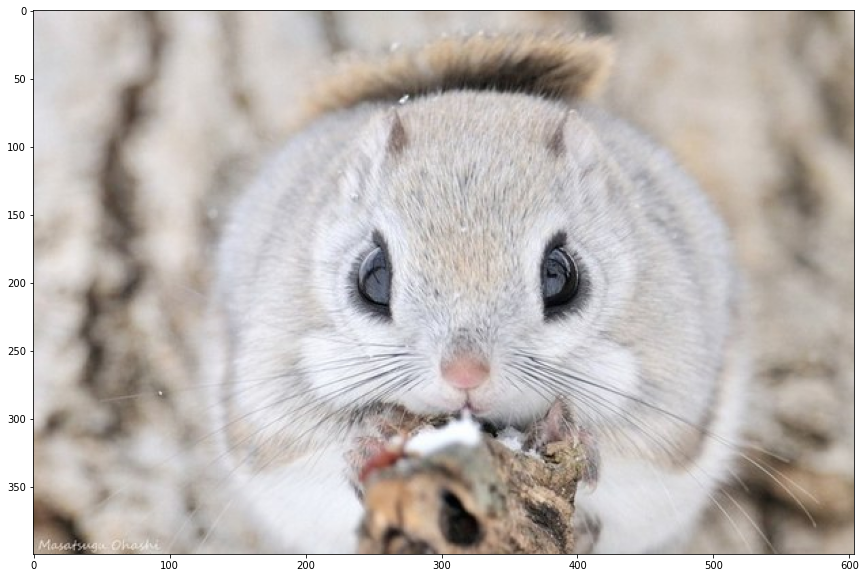

In [2]:
image = io.imread('squirrel.png')
plt.figure(figsize=(20,10))
plt.imshow(image)
plt.show()

## 6. Получите и интерпретируйте размеры картинки.

In [3]:
height, width, _ = image.shape
print('height=',height,'; width=',width)

height= 400 ; width= 604


## 7. Выведите верхнюю и левую половины изображения. 


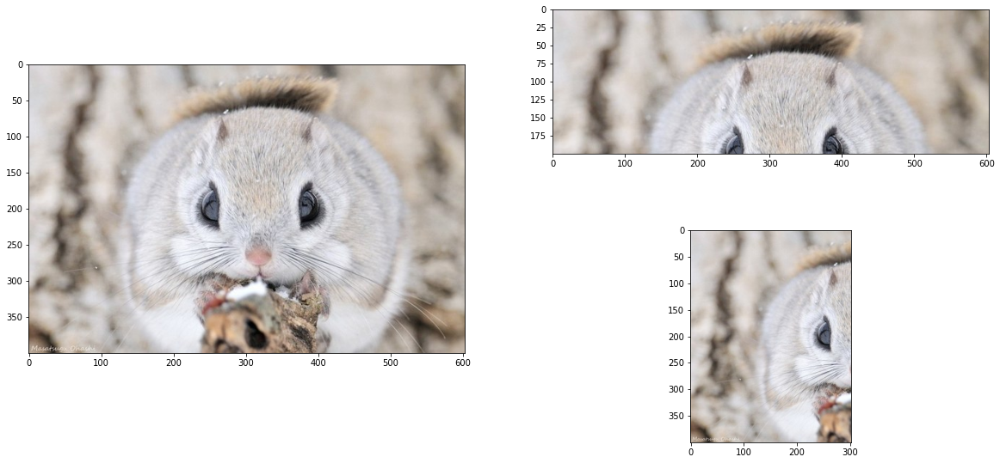

In [4]:
A = image[0:int(height/2),:]
B = image[:,0:int(width/2)]
# print(image.shape, A.shape, B.shape)
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(image)
plt.subplot(222), plt.imshow(A) 
plt.subplot(224), plt.imshow(B) 
plt.show()

## 8. Выведите произвольный прямоугольник изображения.


(200, 200, 4)


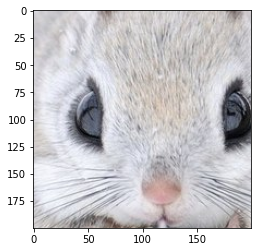

In [5]:
A = image[100:300, 200:400]
print(A.shape)
plt.imshow(A)
plt.show()

## 9. Выведите каждый канал изображения отдельно.


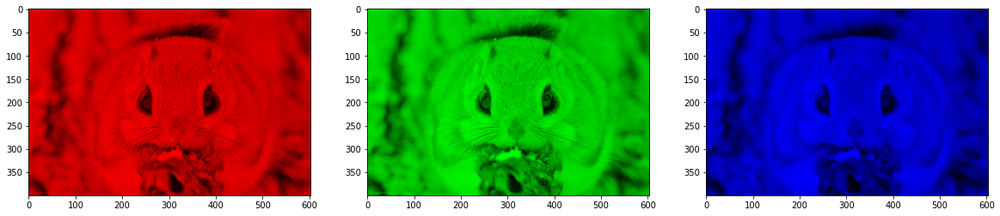

In [6]:
R = image.copy() 
R[:,:,1] = 0
R[:,:,2] = 0

G = image.copy() 
G[:,:,0] = 0
G[:,:,2] = 0

B = image.copy() 
B[:,:,0] = 0
B[:,:,1] = 0

plt.figure(figsize=(20,10))
plt.subplot(131), plt.imshow(R)
plt.subplot(132), plt.imshow(G) 
plt.subplot(133), plt.imshow(B)
plt.show()

## 10. Получите черно-белое изображение путем усреднения по каналам. *Сначала самостоятельно реализуйте усреднение, затем правильно воспользуйтесь функцией numpy* 


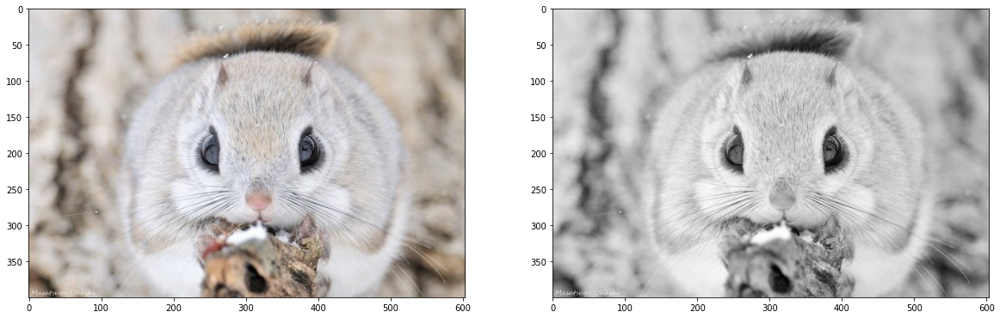

In [7]:
def myrgba2rgb(rgba, background=(255,255,255)):
    row, col, ch = rgba.shape
    if ch == 3:
        return rgba
    assert ch == 4, 'RGBA image has 4 channels.'
    rgb = np.zeros( (row, col, 3), dtype='float32' )
    r, g, b, a = rgba[:,:,0], rgba[:,:,1], rgba[:,:,2], rgba[:,:,3]
    a = np.asarray( a, dtype='float32' ) / 255.0
    R, G, B = background
    rgb[:,:,0] = r * a + (1.0 - a) * R
    rgb[:,:,1] = g * a + (1.0 - a) * G
    rgb[:,:,2] = b * a + (1.0 - a) * B
    return np.asarray( rgb, dtype='uint8' )

image_rgb = myrgba2rgb(image)

R = image_rgb.copy() 
R[:,:,1] = 0
R[:,:,2] = 0

G = image_rgb.copy() 
G[:,:,0] = 0
G[:,:,2] = 0

B = image_rgb.copy() 
B[:,:,0] = 0
B[:,:,1] = 0

def myrgb2gray(R, G, B):
    b = np.array([[[1/3, 1/3, 1/3]]])
    sums = np.round(np.sum((R+G+B) * b, axis=2)).astype(np.uint8)
    k = np.repeat(sums, 3).reshape((R+G+B).shape)
    return k

plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(image)
plt.subplot(122), plt.imshow(myrgb2gray(R, G, B))
plt.show()


## 11. Получите негатив для черно-белого изображения.


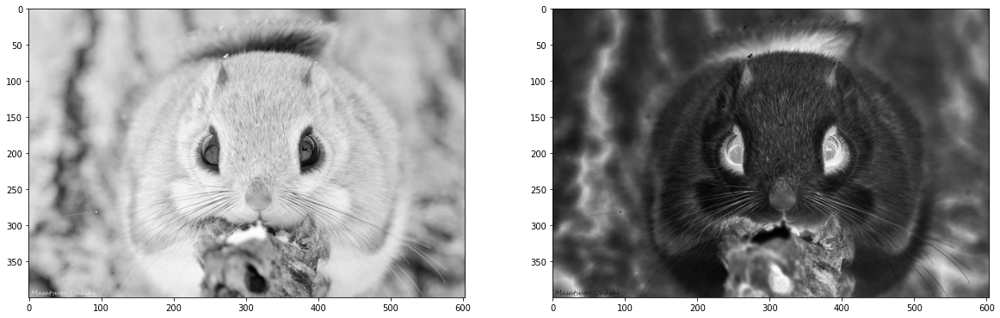

In [8]:
def gray2negative(grey):
    b = np.array([[[255,255,255]]])
    sums = b - grey
    return sums

grey = myrgb2gray(R, G, B)
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(grey)
plt.subplot(122), plt.imshow(gray2negative(grey))
plt.show()



## 12. Бинаризуйте черно-белое изображение по некоторому порогу.


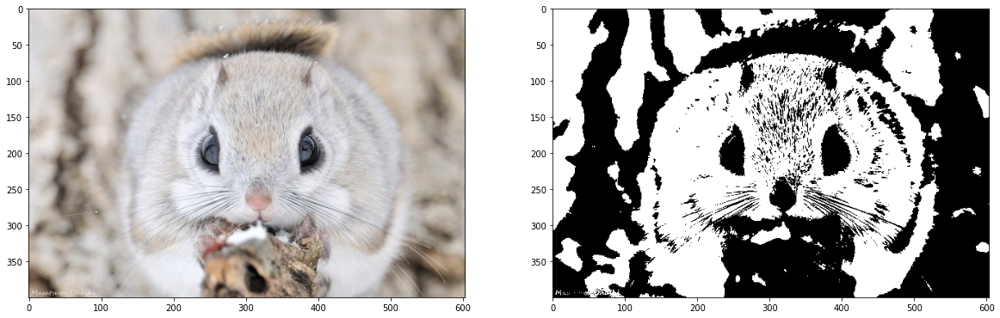

In [9]:
img_gray = color.rgb2gray(color.rgba2rgb(image))
k = 0.75 # Порог бинаризации
binary_thresh_img = img_gray > k
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(image)
plt.subplot(122), plt.imshow(binary_thresh_img, cmap=plt.cm.gray)
plt.show()


## 13. Уменьшите цветное изображение в 2 раза. *Используйте самый элементарный способ*.


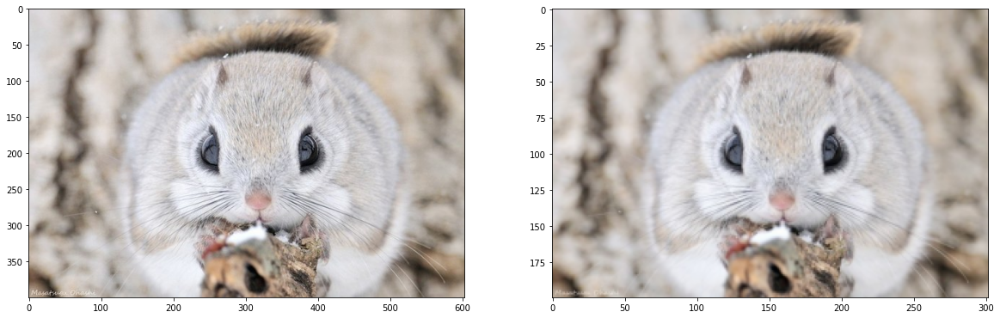

In [10]:
image_resized = transform.resize(image, (height/2, width/2), anti_aliasing=True)
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(image)
plt.subplot(122), plt.imshow(image_resized)
plt.show()

## 14. Отразите цветное изображение по любой из осей.


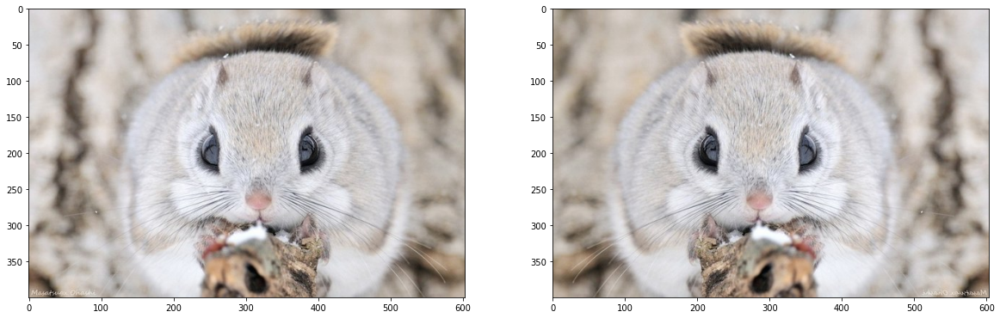

In [11]:
horizontal_flip = image[:, ::-1]
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(image)
plt.subplot(122), plt.imshow(horizontal_flip)
plt.show()

## 15. Поверните на 90 градусов и отразите цветное изображение за константное время.


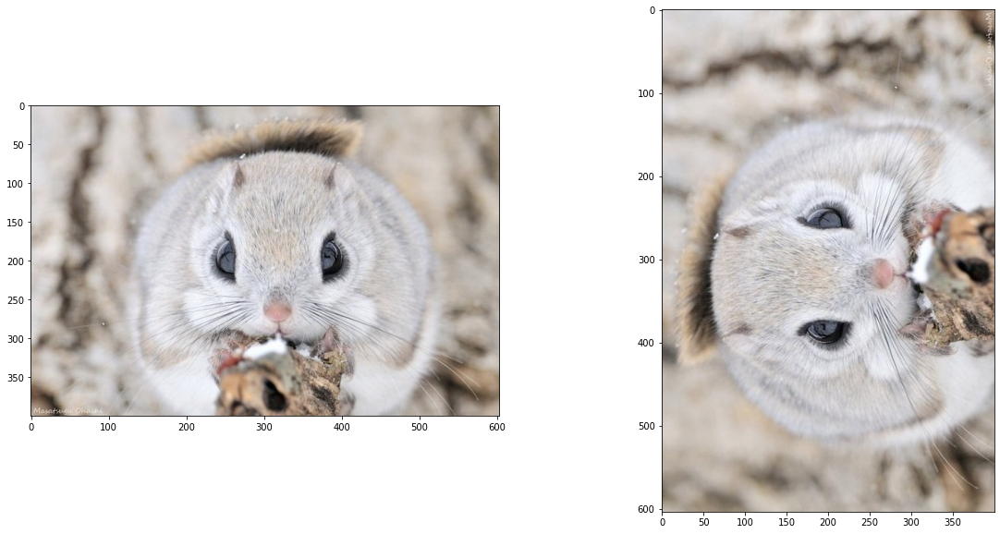

In [12]:
image_rotate = transform.rotate(image, angle=270, resize=True)[:, ::-1]
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(image)
plt.subplot(122), plt.imshow(image_rotate)
plt.show()

## 16. Преобразуйте картинку в матрицу, где строка - это пиксель изображения, а столбцы - это кординаты и значение RGB этого пикселя.

In [13]:
# rgba пикселей
img_l = image.reshape(height*width, 4)

# Индексы
def f1(i, j):
    return i+1

def f2(i, j):
    return j+1

x = np.array(np.fromfunction(f1, (height, width), dtype = int))
y = np.array(np.fromfunction(f2, (height, width), dtype = int))

digits = np.log10(y).astype(np.int32)+1

z = x*(10**digits)+y
z = z.reshape(height*width,1)


# Количество всех пикселей 
a = np.array(range(height*width), int)
a = a.reshape(height*width,1)

one = np.hstack((a, z))
two = np.hstack((one, img_l))
two = np.hsplit(two, [1, 2])
print(two)

[array([[     0],
       [     1],
       [     2],
       ...,
       [241597],
       [241598],
       [241599]]), array([[    11],
       [    12],
       [    13],
       ...,
       [400602],
       [400603],
       [400604]]), array([[218, 212, 216, 255],
       [217, 211, 215, 255],
       [218, 212, 216, 255],
       ...,
       [194, 182, 168, 255],
       [195, 183, 169, 255],
       [196, 184, 170, 255]])]
